In [175]:
import json 
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
import cv2
from datetime import datetime
from scipy.optimize import least_squares

In [177]:
with open("homo_kafka/kafka_messages_full_area.json","r", encoding="utf-8") as f:
    data = json.load(f)

print(data[:1000])

[{'timestamp': '2026-01-15T14:22:50.277000+00:00', 'partition': 0, 'offset': 976763, 'value': {'cam_231': {'area': [1], 'bboxes': [[849.3333740234375, 213.1875, 924.6666870117188, 318.75], [946.6666870117188, 167.53125, 1082.666748046875, 261.1875]], 'dewrap_view': ['view2', 'view3'], 'fisheye_positions_x_y': [[1981.24609375, 1214.552001953125], [2016.1671142578125, 1102.35107421875]], 'frame_id': '25122', 'heading_angle': [999.0, 356.2701110839844], 'object_area': [1, 1], 'object_association_ids': [0, 1], 'object_classes': ['person', 'forklift'], 'object_confidences': [0.91357421875, 0.96142578125], 'object_ids': [360, 175], 'object_positions_x_y': [[581.543701171875, 1320.96044921875], [391.8336486816406, 1321.734375]], 'timestamp': '2026-01-15 15:22:50.276', 'vest_flags': [False, False]}}}, {'timestamp': '2026-01-15T14:22:50.284000+00:00', 'partition': 0, 'offset': 976764, 'value': {'cam_229': {'area': [1], 'bboxes': [[64.16667175292969, 269.4375, 665.0, 706.5], [513.0, 207.75, 622.

In [178]:
# Kafka message filter
fisheye_cam_id = ["cam_229", "cam_233","cam_234","cam_231"]
fisheye_data = {cam:[] for cam in fisheye_cam_id}
def parse_ts(ts_str):
    return datetime.fromisoformat(ts_str.replace("Z", "+00:00"))
def area_bbox(position_bbox):
    x1,y1,x2,y2 = position_bbox
    width  = x2 - x1
    height = y2 - y1
    return width * height
def aspect_ratio_bbox(position_bbox):
    x1, y1, x2, y2 = position_bbox
    width = x2 - x1
    height = y2 - y1

    if height == 0:
        return None  # avoid division by zero

    return width / height
     
pair = []
for i in fisheye_cam_id:
    for j in fisheye_cam_id:
        if i == j:
            continue
        if (j,i) not in pair:
            pair.append((i,j))
            
for msg in data:
    kafka_ts = msg.get("timestamp")
    value = msg.get("value", {})

    for cam_id, cam in value.items():
        if cam_id not in fisheye_cam_id:
            continue

        classes = cam.get("object_classes", [])
        positions = cam.get("fisheye_positions_x_y", [])
        vest_flags = cam.get("vest_flags",[])
        bboxes = cam.get("bboxes",[])


        for i, condition_vest in enumerate(vest_flags):
            if condition_vest:
                cls = classes[i] 
                if cls == "person" and i < len(positions):
                    entry = {
                        "camera": cam_id,
                        "frame_id": cam.get("frame_id"),
                        "position": positions[i],
                        "camera_timestamp": cam.get("timestamp"),
                        "area_bbox": area_bbox(bboxes[i]),
                        "aspect_ratio_bbox": aspect_ratio_bbox(bboxes[i]),
                        "kafka_timestamp_ms": int(
                            datetime.fromisoformat(kafka_ts.replace("Z","+00:00"))
                            .timestamp() * 1000)
                    }

                    fisheye_data[cam_id].append(entry)

# Processing
def undistort_points(pts, K_fish, D_fish, K_rect):
    pts = np.asarray(pts, np.float32).reshape(-1, 1, 2)
    out = cv2.fisheye.undistortPoints(pts, K_fish, D_fish, P=K_rect)
    return out.reshape(-1, 2)
fisheye_params = {
    "width": 2592, "height": 1944,
    "cx": 1296.0, "cy": 972.0,
    "radius": 952.56, "theta_max_rad": 1.5708
}

rect_w, rect_h = 2560, 2560
fov = 160  
focal = (rect_w / 2) / np.tan(np.deg2rad(fov) / 2)

K_rect = np.array([[focal, 0, rect_w/2],
                   [0, focal, rect_h/2],
                   [0, 0, 1]], np.float32)

f_fish = fisheye_params["radius"] / fisheye_params["theta_max_rad"]
K_fish = np.array([[f_fish, 0, fisheye_params["cx"]],
                   [0, f_fish, fisheye_params["cy"]],
                   [0, 0, 1]], np.float32)

D_fish = np.zeros((4, 1), np.float32)

TOL_MS = 10
MIN_EDGE_DIST = 40
undistorted_pair_points = {}
undistorted_pair_points_gt = {}
for p in pair:
    a,b = p
    fisheye_a_common = []
    fisheye_b_common = []

    fisheye_a_sorted = sorted(fisheye_data[a], key=lambda x: x["kafka_timestamp_ms"])
    fisheye_b_sorted = sorted(fisheye_data[b], key=lambda x: x["kafka_timestamp_ms"])
    i, j = 0, 0
    while i < len(fisheye_a_sorted) and j < len(fisheye_b_sorted):
        ts_a = fisheye_a_sorted[i]["kafka_timestamp_ms"]
        ts_b = fisheye_b_sorted[j]["kafka_timestamp_ms"]

        if abs(ts_a - ts_b) <= TOL_MS:
            fisheye_a_common.append(fisheye_a_sorted[i])
            fisheye_b_common.append(fisheye_b_sorted[j])
            i += 1
            j += 1
        elif ts_a < ts_b:
            i += 1
        else:
            j += 1

    print(f"Matched pairs {a} - {b}".format(TOL_MS, len(fisheye_a_common)))

    pts_a = np.array([d["position"] for d in fisheye_a_common],dtype=np.float32)
    pts_b = np.array([d["position"] for d in fisheye_b_common],dtype=np.float32)
    pts_a_ua = undistort_points(pts_a, K_fish, D_fish, K_rect)
    pts_b_ub = undistort_points(pts_b, K_fish, D_fish, K_rect)
    key = f"pair_{a.split('_')[1]}_{b.split('_')[1]}"
    undistorted_pair_points_gt[key] = [pts_a_ua.tolist(), pts_b_ub.tolist()]
    hull_a_idx = set(cv2.convexHull(pts_a, returnPoints=False).squeeze().tolist())
    hull_b_idx = set(cv2.convexHull(pts_b, returnPoints=False).squeeze().tolist())
    common_idx = sorted(hull_a_idx & hull_b_idx)
    print("Polygon points:", len(common_idx))
    pts_a_final = pts_a[common_idx]
    pts_b_final = pts_b[common_idx]

    def ccw_order_indices(pts):
        center = np.mean(pts, axis=0)
        angles = np.arctan2(
            pts[:, 1] - center[1],
            pts[:, 0] - center[0]
        )
        return np.argsort(angles)

    order = ccw_order_indices(pts_a_final)

    pts_a_final = pts_a_final[order]
    pts_b_final = pts_b_final[order]
    keep = [0]
    for i in range(1, len(pts_a_final)):
        dist_a = np.linalg.norm(pts_a_final[i] - pts_a_final[keep[-1]])
        dist_b = np.linalg.norm(pts_b_final[i] - pts_b_final[keep[-1]])

        if dist_a >= MIN_EDGE_DIST and dist_b >= MIN_EDGE_DIST:
            keep.append(i)


    pts_a_final = pts_a_final[keep]
    pts_b_final = pts_b_final[keep]
    print("Final polygon points:", (pts_b_final.shape[0]))
    assert pts_a_final.shape == pts_b_final.shape
    assert pts_a_final.shape[0] >= 4
    ua = undistort_points(pts_a_final, K_fish, D_fish, K_rect)
    ub = undistort_points(pts_b_final, K_fish, D_fish, K_rect)
    key = f"pair_{a.split('_')[1]}_{b.split('_')[1]}"
    undistorted_pair_points[key] = [ua.tolist(), ub.tolist()]





Matched pairs cam_229 - cam_233
Polygon points: 10
Final polygon points: 8
Matched pairs cam_229 - cam_234
Polygon points: 8
Final polygon points: 7
Matched pairs cam_229 - cam_231
Polygon points: 10
Final polygon points: 8
Matched pairs cam_233 - cam_234
Polygon points: 8
Final polygon points: 8
Matched pairs cam_233 - cam_231
Polygon points: 10
Final polygon points: 9
Matched pairs cam_234 - cam_231
Polygon points: 9
Final polygon points: 7


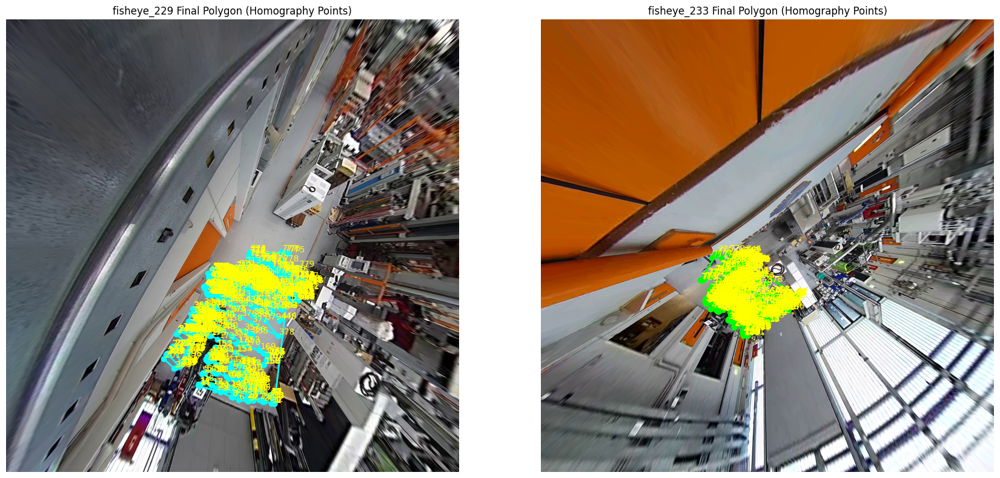

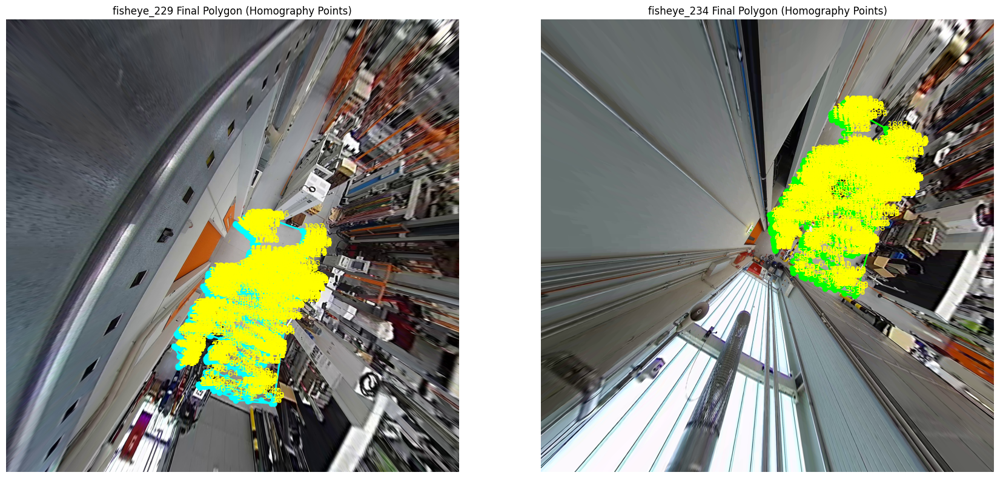

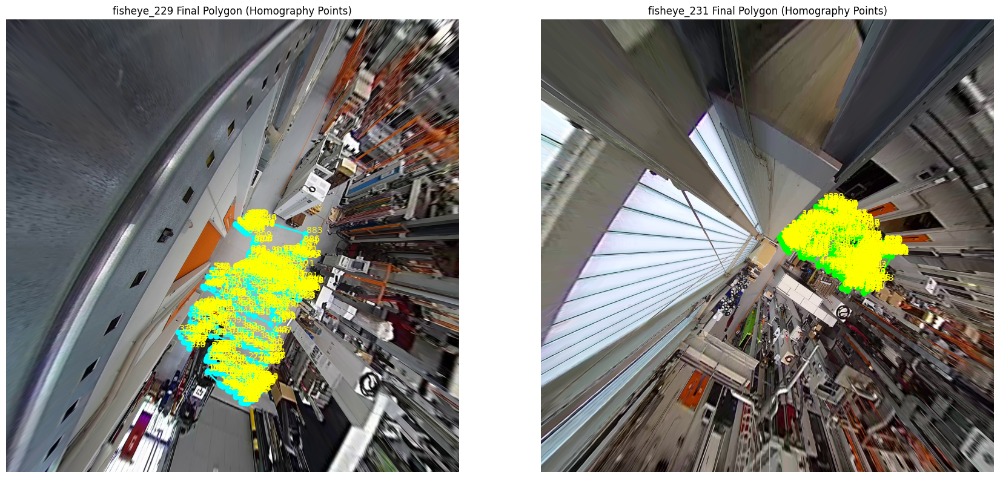

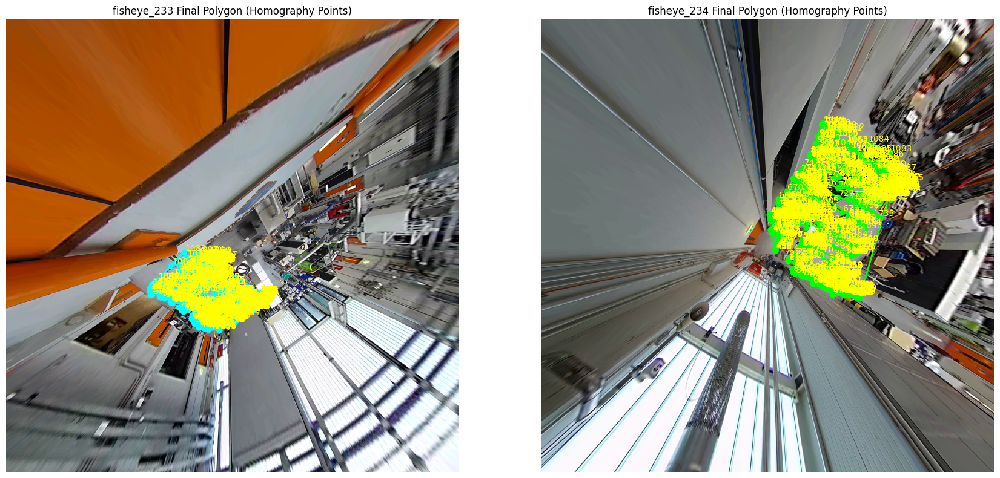

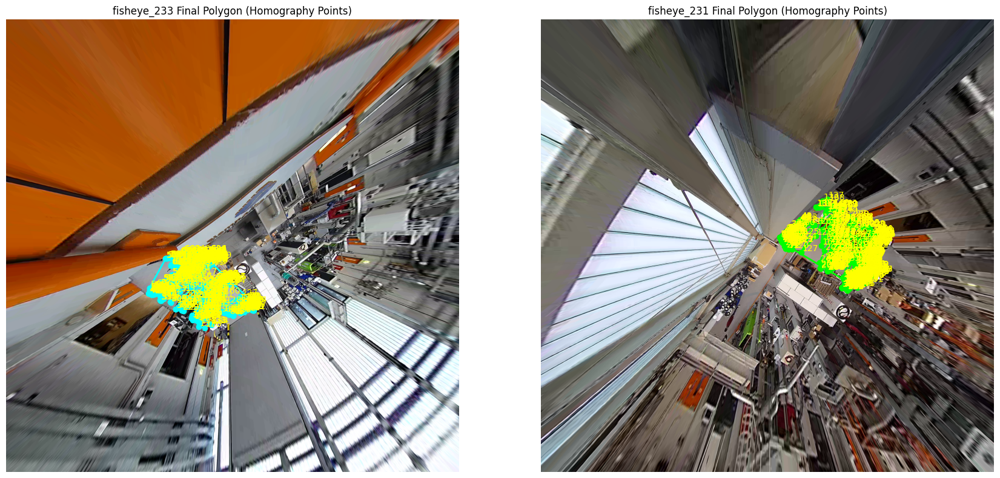

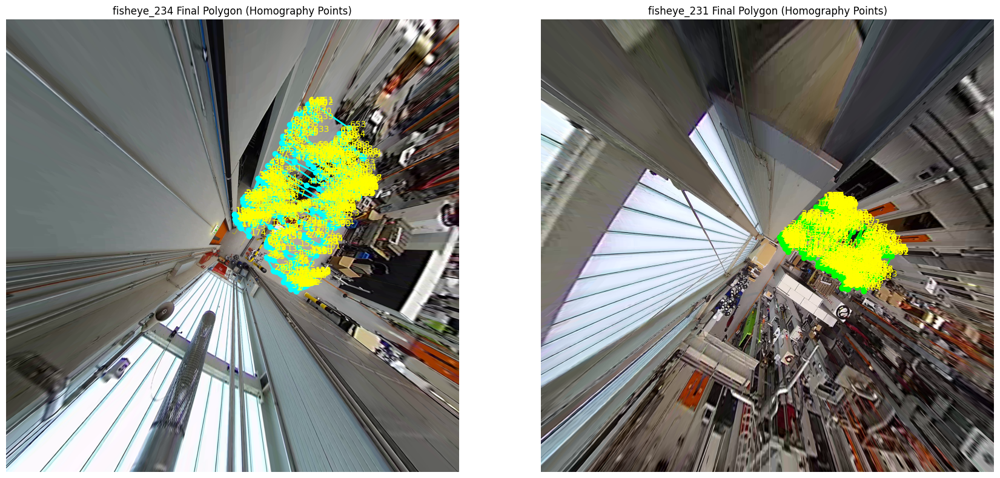

In [179]:

img_229 = cv2.cvtColor(cv2.imread("229_fov/fov_160.jpg"), cv2.COLOR_BGR2RGB)
img_233 = cv2.cvtColor(cv2.imread("cam_4/cam_233_undistort.png"), cv2.COLOR_BGR2RGB)
img_234 = cv2.cvtColor(cv2.imread("cam_4/cam_234_undistort.png"), cv2.COLOR_BGR2RGB)
img_231 = cv2.cvtColor(cv2.imread("cam_4/cam_231_undistort.png"), cv2.COLOR_BGR2RGB)
img_map = {
    "229": img_229,
    "233": img_233,
    "234": img_234,
    "231": img_231
}

def plot_polygon_on_image(ax, img, pts, title, color):
    ax.imshow(img)
    closed = np.vstack([pts, pts[0]])
    ax.plot(
        closed[:, 0],
        closed[:, 1],
        "-o",
        color=color,
        linewidth=2,
        markersize=6
    )

    for i, (x, y) in enumerate(pts):
        ax.text(x + 6, y - 6, str(i), color="yellow", fontsize=10)

    ax.set_title(title)
    ax.axis("off")

for p,val in undistorted_pair_points_gt.items():
    _,a,b = p.split("_")
    fig, axs = plt.subplots(1, 2, figsize=(18, 8))
    plot_polygon_on_image(axs[0],img_map[a], val[0],f"fisheye_{a} Final Polygon (Homography Points)",color="cyan")
    plot_polygon_on_image(axs[1],img_map[b], val[1],f"fisheye_{b} Final Polygon (Homography Points)",color="lime")

    plt.tight_layout()
    plt.show()


In [20]:
def polygon_area(pts):
    pts = np.asarray(pts, np.float32)
    x, y = pts[:,0], pts[:,1]
    return 0.5 * abs(np.dot(x, np.roll(y, -1)) - np.dot(y, np.roll(x, -1)))

# Build adjacency + overlap

adj = defaultdict(set)
pair_area = {}

for key, (pa, pb) in undistorted_pair_points.items():
    _, a, b = key.split("_")
    A = polygon_area(pa)
    B = polygon_area(pb)
    ov = min(A, B)
    adj[a].add(b)
    adj[b].add(a)
    pair_area[(a,b)] = ov
    pair_area[(b,a)] = ov

# Anchor selection
anchors = []
covered = set()
ordered = sorted(adj.keys(), key=lambda c: len(adj[c]), reverse=True)
while len(covered) < len(adj):
    candidates = [
        c for c in ordered
        if c not in covered and len(adj[c]) > 1
    ]
    if not candidates:
        break
    anchor = candidates[0]
    anchors.append(anchor)
    covered.add(anchor)
    covered |= adj[anchor]

# Assignment
assignment = {}

for cam in adj:
    if cam in anchors:
        continue

    possible = [a for a in anchors if cam in adj[a]]
    

    if possible:
        assignment[cam] = max(
            possible,
            key=lambda a: pair_area[(cam, a)]
        )
    else:
        new_anchor = max(
            adj[cam],
            key=lambda n: pair_area[(cam, n)]
        )
        anchors.append(new_anchor)
        assignment[new_anchor] = new_anchor
        assignment[cam] = new_anchor

assignment


{'233': '229', '234': '229', '231': '229'}

In [186]:
def min_homography_selection(src, dst, h0, final):
    homos = []
    errors = []

    configs = [("lm", "linear"),("trf", "huber"),("trf", "soft_l1"),("trf", "cauchy"),("trf", "arctan")]

    for method, loss in configs:
        homo_, err = run_ba(method, loss, 1, src, dst, h0, final)
        homos.append(homo_)
        errors.append(err)

    idx = np.argmin(errors)
    return homos[idx], errors[idx]

def reprojection_residuals(h, src, dst, final= False):
    if final:
        h_8 = h[8]
    else:
        h_8 = 1.0
    H = np.array([
        [h[0], h[1], h[2]],
        [h[3], h[4], h[5]],
        [h[6], h[7], h_8]
    ])

    src_h = np.hstack([src, np.ones((len(src), 1))])
    proj = (H @ src_h.T).T
    proj = proj[:, :2] / proj[:, 2:3]

    return (proj - dst).ravel()

def run_ba(method, loss, f_scale, src, dst, h0, final= False):
    res = least_squares(
        reprojection_residuals,
        h0,
        method=method,
        loss=loss,
        f_scale=f_scale,
        args=(src, dst, final)
    )
    h = res.x
    if final:
        h_8 = h[8]
    else:
        h_8 = 1.0
    H = np.array([
        [h[0], h[1], h[2]],
        [h[3], h[4], h[5]],
        [h[6], h[7], h_8]
    ])

    proj = cv2.perspectiveTransform(src.reshape(-1,1,2).astype(np.float32),H.astype(np.float32)).reshape(-1,2)
    err = np.linalg.norm(proj - dst, axis=1)
    return H, err.mean()

ref_homography = {"229":"cam_229_homo.npy"} 
homography = {}
ref = [k for k,v in ref_homography.items()]
h_ref = np.load("cam_229_homo.npy")
for p,val in undistorted_pair_points.items():
    _,a,b=p.split("_")
    if a in ref:
        src = np.asarray(val[1], dtype=np.float32)
        dst = np.asarray(val[0], dtype=np.float32)
        src_ref = np.asarray(val[0], dtype=np.float32)
        key = f"Homography_{b}"
        if b in assignment:
            ref_considered_b = assignment[b]
            h_ref = np.load(ref_homography[ref_considered_b])
            ref_cam = a
            cam_ = b
    elif b in ref:
        src = np.asarray(val[0], dtype=np.float32)
        dst = np.asarray(val[1], dtype=np.float32)
        src_ref = np.asarray(val[1], dtype=np.float32)
        key = f"Homography_{a}"
        if a in assignment:
            ref_considered_a = assignment[a]
            h_ref = np.load(ref_homography[ref_considered_a])
            ref_cam = b
            cam_ = a
    else:
        continue

    homo,_ = cv2.findHomography(src,dst,cv2.RANSAC)
    proj = cv2.perspectiveTransform(src.reshape(-1,1,2), homo).reshape(-1,2)
    err = np.linalg.norm(proj - dst, axis=1)
    print(f"Mean Error {cam_}:", err.mean())
    h0 = homo.flatten()
    relative_homo, relative_error = min_homography_selection(src, dst, h0, False)
    print(f"Relative Mean Error {cam_}:", relative_error)
    h_relative_ground = h_ref @ relative_homo
    proj_relative_ground = cv2.perspectiveTransform(src.reshape(-1,1,2), h_relative_ground).reshape(-1,2)
    proj_ref_ground = cv2.perspectiveTransform(src_ref.reshape(-1,1,2), h_ref).reshape(-1,2)
    proj_err = np.linalg.norm(proj_relative_ground - proj_ref_ground, axis=1)
    print(f"Mean Ground Proj Error {cam_}:", proj_err.mean())
    h_relative_ground = h_relative_ground.flatten()
    final_homo, final_error = min_homography_selection(src, proj_ref_ground, h_relative_ground, True)
    print(f"Final Mean Error {cam_}: {final_error}\n")
    if homography.get(ref_cam) is None:
        homography[f"Homography_{ref_cam}"] = h_ref
    if homography.get(key) is None:
        homography[key] = final_homo
    else:
        continue
homography

Mean Error 233: 64.53723
Relative Mean Error 233: 10.343288
Mean Ground Proj Error 233: 2.5158837
Final Mean Error 233: 2.388871431350708

Mean Error 234: 28.188856
Relative Mean Error 234: 20.861467
Mean Ground Proj Error 234: 5.4555755
Final Mean Error 234: 5.287503719329834

Mean Error 231: 52.577274
Relative Mean Error 231: 21.655249
Mean Ground Proj Error 231: 6.0773273
Final Mean Error 231: 4.927987098693848



{'Homography_229': array([[-2.43229184e-01,  2.93317061e-01,  1.19626407e+03],
        [-3.24129531e-01, -6.24119645e-02,  1.18698319e+03],
        [-1.10512320e-04,  8.79198669e-05,  1.00000000e+00]]),
 'Homography_233': array([[-2.37453084e+00, -2.83791116e+00,  1.45006779e+04],
        [-3.25624257e+00, -3.89632652e-01,  7.85343983e+03],
        [-2.60595854e-03, -3.26220733e-03,  1.34880427e+01]]),
 'Homography_234': array([[-1.40582012e-01,  2.80573479e-01,  1.55680020e+03],
        [-2.92784975e-01, -1.17347997e-01,  1.38245501e+03],
        [-2.20723150e-06,  5.66453591e-05,  1.13265008e+00]]),
 'Homography_231': array([[-4.39550251e-01, -2.41187773e-01,  2.99288453e+03],
        [ 3.33132247e-01, -5.06169903e-01,  1.03228844e+03],
        [-3.40592543e-05, -5.36871055e-06,  1.50711356e+00]])}

In [29]:
pair

[('cam_229', 'cam_233'),
 ('cam_229', 'cam_234'),
 ('cam_229', 'cam_231'),
 ('cam_233', 'cam_234'),
 ('cam_233', 'cam_231'),
 ('cam_234', 'cam_231')]

In [ ]:
def min_homography_selection(src, dst, h0, final):
    homos = []
    errors = []

    configs = [("lm", "linear"),("trf", "huber"),("trf", "soft_l1"),("trf", "cauchy"),("trf", "arctan")]

    for method, loss in configs:
        homo_, err = run_ba(method, loss, 1, src, dst, h0, final)
        homos.append(homo_)
        errors.append(err)

    idx = np.argmin(errors)
    return homos[idx], errors[idx]

def reprojection_residuals(h, src, dst, final= False):
    if final:
        h_8 = h[8]
    else:
        h_8 = 1.0
    H = np.array([
        [h[0], h[1], h[2]],
        [h[3], h[4], h[5]],
        [h[6], h[7], h_8]
    ])

    src_h = np.hstack([src, np.ones((len(src), 1))])
    proj = (H @ src_h.T).T
    proj = proj[:, :2] / proj[:, 2:3]

    return (proj - dst).ravel()

def run_ba(method, loss, f_scale, src, dst, h0, final= False):
    res = least_squares(
        reprojection_residuals,
        h0,
        method=method,
        loss=loss,
        f_scale=f_scale,
        args=(src, dst, final)
    )
    h = res.x
    if final:
        h_8 = h[8]
    else:
        h_8 = 1.0
    H = np.array([
        [h[0], h[1], h[2]],
        [h[3], h[4], h[5]],
        [h[6], h[7], h_8]
    ])

    proj = cv2.perspectiveTransform(src.reshape(-1,1,2).astype(np.float32),H.astype(np.float32)).reshape(-1,2)
    err = np.linalg.norm(proj - dst, axis=1)
    return H, err.mean()

# ref_homography = {"229":"cam_229_homo.npy"} 
# homography = {}
# ref = [k for k,v in ref_homography.items()]
# h_ref = np.array([[-2.37453084e+00, -2.83791116e+00,  1.45006779e+04],
#         [-3.25624257e+00, -3.89632652e-01,  7.85343983e+03],
#         [-2.60595854e-03, -3.26220733e-03,  1.34880427e+01]]) #233
h_ref = np.array([[-1.40582012e-01,  2.80573479e-01,  1.55680020e+03],
        [-2.92784975e-01, -1.17347997e-01,  1.38245501e+03],
        [-2.20723150e-06,  5.66453591e-05,  1.13265008e+00]]) #234
for p,val in undistorted_pair_points.items():
    _,a,b=p.split("_")
    # if a in ref:
    #     src = np.asarray(val[1], dtype=np.float32)
    #     dst = np.asarray(val[0], dtype=np.float32)
    #     src_ref = np.asarray(val[0], dtype=np.float32)
    #     key = f"Homography_{b}"
    #     if b in assignment:
    #         ref_considered_b = assignment[b]
    #         h_ref = np.load(ref_homography[ref_considered_b])
    #         ref_cam = a
    #         cam_ = b
    # elif b in ref:
    #     src = np.asarray(val[0], dtype=np.float32)
    #     dst = np.asarray(val[1], dtype=np.float32)
    #     src_ref = np.asarray(val[1], dtype=np.float32)
    #     key = f"Homography_{a}"
    #     if a in assignment:
    #         ref_considered_a = assignment[a]
    #         h_ref = np.load(ref_homography[ref_considered_a])
    #         ref_cam = b
    #         cam_ = a
    # else:
    #     continue
    if (a=='233') and (b=='234'):
        print(p)
        cam_ ="234"
        src = np.asarray(val[0], dtype=np.float32)
        dst = np.asarray(val[1], dtype=np.float32)
        # src_ref = np.asarray(val[0], dtype=np.float32)
        src_anchor_gt = np.asarray(undistorted_pair_points_gt[p][1], dtype=np.float32)
        src_gt = np.asarray(undistorted_pair_points_gt[p][0], dtype=np.float32)
        homo,_ = cv2.findHomography(src,dst,cv2.RANSAC)
        proj = cv2.perspectiveTransform(src.reshape(-1,1,2), homo).reshape(-1,2)
        err = np.linalg.norm(proj - dst, axis=1)
        print(f"Mean Error {cam_}:", err.mean())
        h0 = homo.flatten()
        relative_homo, relative_error = min_homography_selection(src, dst, h0, False)
        print(f"Relative Mean Error {cam_}:", relative_error)
        h_relative_ground = h_ref @ relative_homo
        proj_relative_ground = cv2.perspectiveTransform(src_gt.reshape(-1,1,2), h_relative_ground).reshape(-1,2)
        proj_ref_ground = cv2.perspectiveTransform(src_anchor_gt.reshape(-1,1,2), h_ref).reshape(-1,2)
        proj_err = np.linalg.norm(proj_relative_ground - proj_ref_ground, axis=1)
        print(f"Mean Ground Proj Error {cam_}:", proj_err.mean())
        h_relative_ground = h_relative_ground.flatten()
        final_homo, final_error = min_homography_selection(src_gt, proj_ref_ground, h_relative_ground, True)
        print(f"Final Mean Error {cam_}: {final_error}")
        print(f"Final Homo {cam_}: {final_homo}")
    # if homography.get(ref_cam) is None:
    #     homography[f"Homography_{ref_cam}"] = h_ref
    # if homography.get(key) is None:
    #     homography[key] = final_homo
    # else:
    #     continue


pair_233_234
Mean Error 234: 10.411942
Relative Mean Error 234: 10.037458
Mean Ground Proj Error 234: 5.7246957
Final Mean Error 234: 5.144889831542969
Final Homo 234: [[-7.34990253e-02 -1.84650058e-01  1.01259845e+03]
 [-2.18727747e-01  5.45498552e-05  5.55478633e+02]
 [-1.27997107e-04 -2.45529664e-04  1.00000000e+00]]


In [ ]:
undistorted_pair_points_gt[p]

[[[1512.1776123046875, 2172.6904296875],
  [1365.0689697265625, 2160.3994140625],
  [1376.1170654296875, 2153.934814453125],
  [1297.8170166015625, 2156.931884765625],
  [1279.962646484375, 2137.569091796875],
  [1272.8160400390625, 2135.27099609375],
  [1204.8739013671875, 2109.81201171875],
  [1180.97412109375, 2098.719970703125],
  [1174.923095703125, 2099.2451171875],
  [1166.2510986328125, 2088.71435546875],
  [1160.1634521484375, 2077.45947265625],
  [1156.6959228515625, 2072.1826171875],
  [1149.574462890625, 2074.04052734375],
  [1133.4979248046875, 2077.923095703125],
  [1120.781005859375, 2077.656494140625],
  [1118.98779296875, 2077.142333984375],
  [1103.1927490234375, 2076.41064453125],
  [1097.40283203125, 2079.023681640625],
  [1094.9246826171875, 2079.4931640625],
  [1093.7349853515625, 2079.3828125],
  [1093.76513671875, 2074.861572265625],
  [1093.349853515625, 2063.048095703125],
  [1092.7197265625, 2063.33251953125],
  [1089.9805908203125, 2063.946044921875],
  [108

In [ ]:
def min_homography_selection(src, dst, h0, final):
    homos = []
    errors = []

    configs = [("lm", "linear"),("trf", "huber"),("trf", "soft_l1"),("trf", "cauchy"),("trf", "arctan")]

    for method, loss in configs:
        homo_, err = run_ba(method, loss, 1, src, dst, h0, final)
        homos.append(homo_)
        errors.append(err)

    idx = np.argmin(errors)
    return homos[idx], errors[idx]
def reprojection_residuals(h, src, dst, final= False):
    if final:
        h_8 = h[8]
    else:
        h_8 = 1.0
    H = np.array([
        [h[0], h[1], h[2]],
        [h[3], h[4], h[5]],
        [h[6], h[7], h_8]
    ])

    src_h = np.hstack([src, np.ones((len(src), 1))])
    proj = (H @ src_h.T).T
    proj = proj[:, :2] / proj[:, 2:3]

    return (proj - dst).ravel()

def run_ba(method, loss, f_scale, src, dst, h0, final= False):
    res = least_squares(
        reprojection_residuals,
        h0,
        method=method,
        loss=loss,
        f_scale=f_scale,
        args=(src, dst, final)
    )
    h = res.x
    if final:
        h_8 = h[8]
    else:
        h_8 = 1.0
    H = np.array([
        [h[0], h[1], h[2]],
        [h[3], h[4], h[5]],
        [h[6], h[7], h_8]
    ])

    proj = cv2.perspectiveTransform(src.reshape(-1,1,2).astype(np.float32),H.astype(np.float32)).reshape(-1,2)
    err = np.linalg.norm(proj - dst, axis=1)
    return H, err.mean()

# ref_homography = {"229":"cam_229_homo.npy"} 
# homography = {}
# ref = [k for k,v in ref_homography.items()]
h_ref = np.array([[-2.37453084e+00, -2.83791116e+00,  1.45006779e+04],
        [-3.25624257e+00, -3.89632652e-01,  7.85343983e+03],
        [-2.60595854e-03, -3.26220733e-03,  1.34880427e+01]])
h_relati = np.array([[-1.08888012e-01, -9.38342588e-01,  2.03833263e+03],
 [ 1.74098903e-01, -2.05176863e-01,  6.72531687e+02],
 [-1.90509744e-04, -2.87296496e-04,  1.00000000e+00]])
for p,val in undistorted_pair_points.items():
    _,a,b=p.split("_")
    # if a in ref:
    #     src = np.asarray(val[1], dtype=np.float32)
    #     dst = np.asarray(val[0], dtype=np.float32)
    #     src_ref = np.asarray(val[0], dtype=np.float32)
    #     key = f"Homography_{b}"
    #     if b in assignment:
    #         ref_considered_b = assignment[b]
    #         h_ref = np.load(ref_homography[ref_considered_b])
    #         ref_cam = a
    #         cam_ = b
    # elif b in ref:
    #     src = np.asarray(val[0], dtype=np.float32)
    #     dst = np.asarray(val[1], dtype=np.float32)
    #     src_ref = np.asarray(val[1], dtype=np.float32)
    #     key = f"Homography_{a}"
    #     if a in assignment:
    #         ref_considered_a = assignment[a]
    #         h_ref = np.load(ref_homography[ref_considered_a])
    #         ref_cam = b
    #         cam_ = a
    # else:
    #     continue
    if (a=='233') and (b=='234'):
        print(p)
        cam_ ="234"
        src = np.asarray(val[1], dtype=np.float32)
        dst = np.asarray(val[0], dtype=np.float32)
        src_ref = np.asarray(val[0], dtype=np.float32)
        homo,_ = cv2.findHomography(src,dst,cv2.RANSAC)  
        proj = cv2.perspectiveTransform(src.reshape(-1,1,2), homo).reshape(-1,2)
        err = np.linalg.norm(proj - dst, axis=1)
        print(f"Mean Error {cam_}:", err.mean())
        h0 = homo.flatten()
        relative_homo, relative_error = min_homography_selection(src, dst, h0, False)
        print(f"Relative Mean Error {cam_}:", relative_error)
        proj_to_anchor_dst = cv2.perspectiveTransform(src_ref.reshape(-1,1,2), h_relati).reshape(-1,2)
        h_to_anchor = h_ref @ relative_homo
        proj_to_anchor = cv2.perspectiveTransform(src.reshape(-1,1,2), h_to_anchor).reshape(-1,2)
        proj_to_anchor_err = np.linalg.norm(proj_to_anchor - proj_to_anchor_dst, axis=1)
        print(f"Mean Error Anchor {cam_}:", proj_to_anchor_err.mean())
        h_to_anchor_flatten = h_to_anchor.flatten()
        relative_homo_anchor, relative_error_anchor = min_homography_selection(proj_to_anchor, proj_to_anchor_dst, h_to_anchor_flatten, True)
        print(f"Relative Mean Error Anchor {cam_}:", relative_error_anchor)
        h_relative_ground = h_ref @ relative_homo_anchor
        proj_relative_ground = cv2.perspectiveTransform(src.reshape(-1,1,2), h_relative_ground).reshape(-1,2)
        proj_ref_ground = cv2.perspectiveTransform(proj_to_anchor_dst.reshape(-1,1,2), h_ref).reshape(-1,2)
        proj_err = np.linalg.norm(proj_relative_ground - proj_ref_ground, axis=1)
        print(f"Mean Ground Proj Error {cam_}:", proj_err.mean())
        h_relative_ground = h_relative_ground.flatten()
        final_homo, final_error = min_homography_selection(src, proj_ref_ground, h_relative_ground, True)
        print(f"Final Mean Error {cam_}: {final_error}")
        print(f"Final Homo {cam_}: {final_homo}")
    # if homography.get(ref_cam) is None:
    #     homography[f"Homography_{ref_cam}"] = h_ref
    # if homography.get(key) is None:
    #     homography[key] = final_homo
    # else:
    #     continue


pair_233_234
Mean Error 234: 7.3277655
Relative Mean Error 234: 7.125534
Mean Error Anchor 234: 920.1954
Relative Mean Error Anchor 234: 11.179035
Mean Ground Proj Error 234: 5178.5176
Final Mean Error 234: 4.122655391693115
Final Homo 234: [[ 3.11724993e+02  8.12285445e+02 -2.85522286e+06]
 [ 6.50321971e+02  1.98224735e+02 -1.92604570e+06]
 [ 3.98254224e-01  8.65135649e-01 -2.59925747e+03]]


In [ ]:
# 233
[[-6.32932107e-02 -8.17181389e-02  4.58875033e+02]
 [-1.03317330e-01 -2.44841831e-03  2.45706919e+02]
 [-7.67264578e-05 -1.02846447e-04  4.38582250e-01]]

# 234
[[-6.05690077e-01  8.47414334e-01  7.87288654e+03]
 [-1.34305545e+00 -8.33081690e-01  6.81989115e+03]
 [ 1.54523918e-05 -8.48904033e-05  5.77218124e+00]]

In [156]:
import numpy as np

def rect(x, y, w, h):
    return np.array([
        [x, y],
        [x + w, y],
        [x + w, y + h],
        [x, y + h]
    ], dtype=np.float32)


undistorted_pair_points = {

    # ----- Anchor 229 connections -----
    "cam_229_233": (
        rect(0, 0, 12, 12),   # area 144 (strong)
        rect(0, 0, 12, 12)
    ),
    "cam_229_231": (
        rect(0, 0, 9, 9),    # area 81
        rect(0, 0, 9, 9)
    ),
    "cam_229_340": (
        rect(0, 0, 8, 8),    # area 64
        rect(0, 0, 8, 8)
    ),

    # ----- Indirect cameras -----
    "cam_233_234": (
        rect(0, 0, 7, 7),    # area 49 (good chain)
        rect(0, 0, 7, 7)
    ),
    "cam_231_234": (
        rect(0, 0, 5, 5),    # area 25 (weaker chain)
        rect(0, 0, 5, 5)
    ),

    # ----- Second anchor -----
    "cam_300_301": (
        rect(0, 0, 10, 10),  # area 100
        rect(0, 0, 10, 10)
    )
}


In [159]:
def polygon_area(pts):
    pts = np.asarray(pts, np.float32)
    x, y = pts[:,0], pts[:,1]
    return 0.5 * abs(np.dot(x, np.roll(y, -1)) - np.dot(y, np.roll(x, -1)))

# Build adjacency + overlap

adj = defaultdict(set)
pair_area = {}

for key, (pa, pb) in undistorted_pair_points.items():
    _, a, b = key.split("_")
    A = polygon_area(pa)
    B = polygon_area(pb)
    ov = min(A, B)
    adj[a].add(b)
    adj[b].add(a)
    pair_area[(a,b)] = ov
    pair_area[(b,a)] = ov

# Anchor selection
anchors = []
covered = set()
ordered = sorted(adj.keys(), key=lambda c: len(adj[c]), reverse=True)
while len(covered) < len(adj):
    candidates = [
        c for c in ordered
        if c not in covered and len(adj[c]) > 1
    ]
    if not candidates:
        break
    anchor = candidates[0]
    anchors.append(anchor)
    covered.add(anchor)
    covered |= adj[anchor]

# Assignment
assignment = {}

for cam in adj:
    if cam in anchors:
        continue

    possible = [a for a in anchors if cam in adj[a]]
    

    if possible:
        assignment[cam] = max(
            possible,
            key=lambda a: pair_area[(cam, a)]
        )
    else:
        new_anchor = max(
            adj[cam],
            key=lambda n: pair_area[(cam, n)]
        )
        anchors.append(new_anchor)
        assignment[cam] = new_anchor

# Chain
chain = {}

for key, (pa, pb) in undistorted_pair_points.items():
    _, a, b = key.split("_")
    if a == b:
        continue

    a_assigned = a in assignment
    b_assigned = b in assignment
    a_anchor_assigned = a in assignment.values()
    b_anchor_assigned = b in assignment.values()
    a_
    if (a_assigned and  b_anchor_assigned) or (b_assigned and a_anchor_assigned) or (a_assigned and b_assigned):
        continue
    else:
        print(a,b)
        b_pairs = [((a_, b_), ov) for (a_, b_), ov in pair_area.items() if b_ == b]
        b_ref_ = [a_ for ((a_,b_),ov) in b_pairs]
        a_anchor = []
        for j in b_ref_:
            for i in anchors:
                if (j!= i) and ((j, i) in pair_area) and (i!=b):
                    a_anchor.append(((j, i), pair_area[(j, i)]))
        mid_and_area= []
        for ((a_, b_), ov) in b_pairs:
            for ((a_1, b_1), ov_1) in a_anchor:
                if a_ == a_1:
                    area_ = ov + ov_1
                    mid_and_area.append((a_,area_))
        mid_cam = max(mid_and_area, key=lambda x: x[1])[0]
        chain[b] = mid_cam
assignment["chain"] = chain

assignment

{'233': '229', '234': '229', '231': '229', 'chain': {}}